# Computational Essay
## Modellere en gitarstreng

Anton Andreas Brekke - antonabr@uio.no

In [1]:
%matplotlib inline
%matplotlib notebook

import numpy as np
import matplotlib.pyplot as plt
from numba import njit
from matplotlib.animation import FuncAnimation
from scipy.io import wavfile
from IPython.display import Audio
from playsound import playsound 
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

## Introduksjon 
Gitarer som mange andre instrumenter er noe vi befinner oss rundt i hverdagen. Det brukes bredt om hele verden, og i all type musikk vi hører på hver dag. Fra klassiske rockeband som Led-Zeppelin og Guns'n Roses, Pink Floyd, til Ed Sheeran og typen på nach som drar frem gitaren og alle hater.

Disse karakterene er interessante i seg selv, men vel som det er også mekanikken bak en slik gitar. En gitarstreng anses som å være en av de fundamentale delene som utgjør en gitar, og disse langstrakte metalltrådene er selve hjernen bak lyden vi hører når vi spiller. Dersom vi plukker en streng og slipper den vil strengen vibrere frem og tilbake med en gitt frekvens, som videre genererer lyd. 

$\textbf{Jeg ønsker å bygge en realistisk modell for hvordan en gitarstreng vibrerer etter å ha plukket den, og bruke denne modellen til }$
$\textbf{å generere en lyd som høres ut som en ekte gitar. Er dette mulig ved å bruke bølgefunksjonen?}$

$\textbf{NB! For animasjoner og plott må cellen kjøre på nytt dersom alle har blitt kjørt.}$

## Teori - basiskunnskap 



### Bølgelikningen 

En gitarstreng kan løses ved å bruke $\textit{bølgelikningen}$, så lenge noen antakelser holder:

* Vi antar at vi har en stram streng, som er rimelig for en gitar. Da vil strengkraften $T$ dominere, og vi kan neglisjere gravitasjonen.


* Vi antar at utslaget ikke er for stort, slik at mesteparten av strengkraften vil virke i horisontal retning. Da vil vinkelen mellom strengen og horisontallinjen være liten, $T_x = T\cos(\phi) = T(1 + O(\phi^2))\approx T$. 

Så lenge disse antakelsene holder kan vi bruke dette til å utlede bølgelikningen, og bølgelikningen gir oss dermed løsningen på en gitarstreng. Vi skriver opp bølgelikningen nedenfor:


$$
\frac{\partial^2f}{\partial x^2} = \frac{1}{v^2}\frac{\partial^2f}{\partial t^2}
$$


En løsning på denne likningen kan for eksempel være en stående bølge, som ser slik ut:


$$
f(x,t) = A\sin(kx - \omega t) + A\sin(kx + \omega t)
$$

som vi kan skrive om ved å bruke identitetene

$$
\sin(a - b) = \sin(a)\cos(b) - \sin(b)\cos(a) \\
\sin(a + b) = \sin(a)\cos(b) + \sin(b)\cos(a)
$$

som

$$
f(x,t) = A_0\sin(kx)\cos(\omega t)
$$

der $A_0 = 2A$.

Vi kan animere hvordan denne løsningen ser ut i rommet (x-aksen) over tid ved å gjøre som i eksempelet nedenfor: 

<IPython.core.display.Javascript object>


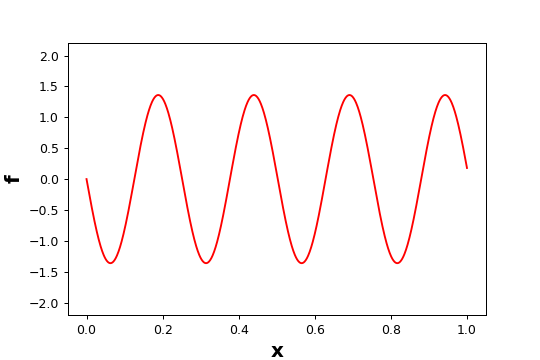

In [2]:
plt.close()
x = np.linspace(0, 1, 1000)
t = np.linspace(0, 10, 1000)
k = 25; w = 3; A = 2

f = lambda x, t: A*np.sin(k*x)*np.cos(w*t)

fig = plt.figure()
ax = fig.add_subplot()

def update(frame):
    ax.clear()
    ax.set_ylim(-1.1*A, 1.1*A)
    ax.set_xlabel('x', fontsize=16, weight='bold'); ax.set_ylabel('f', fontsize=16, weight='bold')
    p, = ax.plot(x, f(x, t[frame]), color='r')
    return p,

ani1= FuncAnimation(fig, update, frames=len(t), interval=10, blit=True)

Men siden bølgelikningen er en lineær likning vil også en sum av løsninger også være en løsning. Dette leder oss til det mer generelle uttrykket for funksjonen vår $f(x,t)$ til 

$$
f(x,t) = \sum_{n=0}^\infty A_n\sin(k_nx)\cos(\omega_nt)
$$

der $k_i$ og $\omega_i$ gis av initialbetingelser. 

På en gitar ønsker vi at endepunktene på gitaren skal forbli fiksert i alle tider t, siden strengen er festet til endene av gitaren. Dette gir oss initialbetingelsen

$$
f(0, t) = f(L, t) 
$$

Dette gir oss ar $\sin(k_nL)\cos(\omega_nt) = 0$, og siden dette skal gjelde for alle $t$-verdier må $\sin(k_nL) = 0$. 
Det betyr at

$$
k_n = \frac{\pi n}{L}
$$

der $n$ er et heltall. Vi kan prøve å animere et eksempel av dette for $n=10$, og se hvordan bølgen ser ut. For en gitar er en gitarstreng av typisk lengde $L=0.65\,\mathrm{m}$. Merk at ikke alle tall kommeer til å være riktig skalert slik at det er mulig å se animasjonen. 

<IPython.core.display.Javascript object>


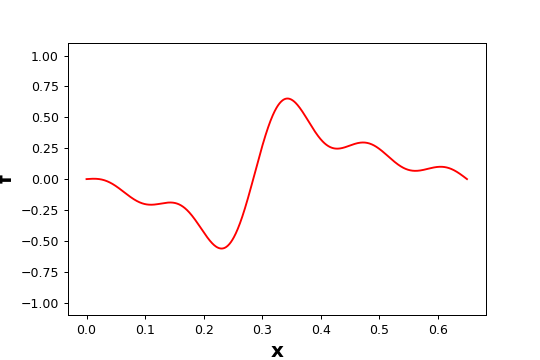

In [3]:
plt.close()

n = 10
L = 0.65
f1 = 0.5    # Hz
k = lambda n: np.pi*n / L
fn = lambda n: n*f1
w = lambda n: 2*np.pi*fn(n)
def A(n):
    return 1 / (n+1)
Amax = np.max(A(np.linspace(0, n, n+1)))

x = np.linspace(0, L, 1000)
t = np.linspace(0, 10, 1000)

def f(x, t, n):
    s = 0
    for i in range(n):
        s += A(i)*np.sin(k(i)*x)*np.cos(w(i)*t)
    return s
    
fig = plt.figure()
ax = fig.add_subplot()

def update(frame):
    ax.clear()
    ax.set_ylim(-1.1*Amax, 1.1*Amax)
    ax.set_xlabel('x', fontsize=16, weight='bold'); ax.set_ylabel('f', fontsize=16, weight='bold')
    p, = ax.plot(x, f(x, t[frame], n), color='r')
    return p,

ani2 = FuncAnimation(fig, update, frames=len(t), interval=10, blit=True)

Merk her at tallet $n$ forteller oss hvor mange bølger vi får på intervallet vårt. Vi kan finne hastigheten på bølgen ved å bruke

$$
f_n = \frac{v}{\lambda} = \frac{nv}{2L} = nf_1
$$

der $f_1$ er grunnfrekvensen på gitaren (mao. noten vi spiller på strengen). Denne kommer til å bli kalt $f$ gjennom hele essayet. Gjennom dette kan vi finne hastigheten til bølgen som 

$$
v = 2L\cdot f
$$

og med dette i boks er vi klar til å gå løs på modellen. 

### Fouriertransformasjon

En Fourier-transformasjon på enkleste form kan skrives som 

$$
F(\omega) = \int_{-\infty}^\infty f(t)\cdot e^{-i\omega t}\;dt
$$

der $f(t)$ er f.eks lydsignalet vårt over tid, og $\omega$ er vinkelfrekvensen. Vi går på sett og vis fra å befinne oss i tidsdomenet av funksjonen og havner over i frekvensdomenet av funksjonen. Vi bruker Fourier-transformasjoner til å finne hvilke frekvenser vi har i lydsignalet vi analyserer, og er et nyttig verktøy vi har med oss. Vi bruker også den inverse Fourier-transformasjonen, som tar oss fra frekvensdomenet og tilbake til tidsdomenet som skrives som 

$$
f(t) = \int_{-\infty}^\infty F(\omega)\cdot e^{i\omega t}\;d\omega
$$

Vi ignorerer normaliseringsfaktorer vi vanligvis har med i Fourier-transformasjonene. 

## Modellering
### Diskretisering av bølgelikningen

Siden vi skal løse dette numerisk på et mesh er vi nødt til å finne en diskretisering av bølgelikningen. Vi bruker definisjonen av den deriverte til å skrive om 

$$
\frac{\partial f}{\partial x} = \frac{f_{i, j+1} - f_{i, j}}{\Delta x}
$$

$$
\frac{\partial f}{\partial t} = \frac{f_{i+1, j} - f_{i, j}}{\Delta t}
$$

og baklengs derivert for dobbeltderivert (kun for å få hensiktsmessige indekser å jobbe med)

$$
\frac{\partial^2 f}{\partial x^2} = \frac{\frac{f_{i, j+1} - f_{i, j}}{\Delta x} - \frac{f_{i, j} - f_{i, j-1}}{\Delta x}}{\Delta x} = \frac{f_{i,j+1} - 2f_{i,j} + f_{i,j-1}}{\Delta x^2}
$$

$$
\frac{\partial^2 f}{\partial t^2} = \frac{\frac{f_{i+1, j} - f_{i, j}}{\Delta t} - \frac{f_{i, j} - f_{i-1, j}}{\Delta t}}{\Delta t} = \frac{f_{i+1,j} - 2f_{i,j} + f_{i-1,j}}{\Delta t^2}
$$

setter vi dette inn i bølgelikningen og løser for det neste tidssteget $f_{i+1, j}$ får vi 

$$
f_{i+1, j} = (v\Delta t)^2\left(\frac{f_{i, j+1} - 2f_{i, j} + f_{i, j-1}}{\Delta x^2} - \frac{1}{v^2}\frac{2f_{i, j} - f_{i, j-1}}{\Delta t^2}\right)
$$

gjennom hele essayet vil vi bruke disse verdiene, med mindre annet er oppgitt:

$$
L = 0.65\,\mathrm{m} \\
N_x = 100 \\
N_t = 10^6 \\ 
dt = 5\cdot 10^{-6}\,\mathrm{s} \\
h = 1\,\mathrm{cm} \\
x_0 = 0.15\,\mathrm{m} \\
f = 130.81\,\mathrm{Hz}
$$

der $L$ er lengden på gitarstrengen (65cm vanlig for en gitar), $N_x$ er antall punkter for $x$, $N_t$ er antall punkter for $t$, $dt$ er tidssteget mellom hvert punkt i $t$, $h$ er initialutslaget på gitarstrengen der vi plukker den (1cm er litt mye, men da er vi sikker på at vi hører gitaren), $x_0$ er posisjonen der vi plukker den (vanlig på ca. 15cm på en gitar), og $f$ er strengens grunnfrekvens. Denne frekvensen tilsvarer noten $C_3$ ifølge https://pages.mtu.edu/~suits/notefreqs.html, og er tredje båndet på den andre strengen på en gitar dersom man teller ovenfra og ned. 

$\textbf{Kommentar til valg av dt og }N_x:$ Det er viktig at vi oppfyller $\textbf{Courantbetingelsen}$ for at løsningen vår skal konvergere. Dermed er det viktig at tidssteget $dt$ oppfyller 


$$
dt < \frac{dx}{v}
$$

noe vi sikrer oss med $dt=5\cdot10^{-6}$. Vi må derfor også passe på $dx = L \;/\; N_x$. I tillegg vil vi da simulere i en total tid $T=N_t\cdot dt = 5\,\mathrm{s}$. Da mangler vi kun å implementere det. Vi starter med å definere alle variabler. 

In [4]:
# Konstanter og variabler
Nx = 100
Nt = 1e6
L = 0.65
dx = L / Nx
dt = 5e-6
f = 130.81         # C3
v = 2*L*f       # v = 1 / (2*L) * np.sqrt(T / mu)
x = np.linspace(0, L, Nx)
h = 1e-2           # m
x0 = 0.15    # x0 er der man plukker gitaren fra pickupen, m

Vi definerer initialbetingelser, og plotter det for å se.  

<IPython.core.display.Javascript object>


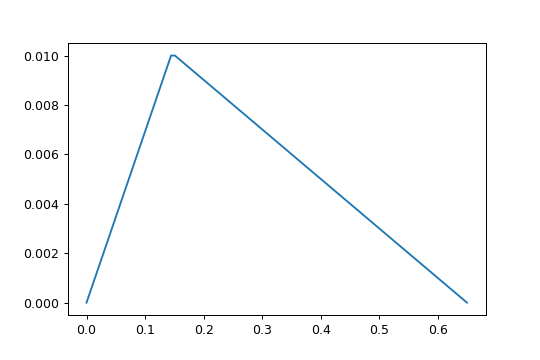

In [5]:
plt.close()
# Hvor man plukker gitarstrengen, initialbetingelse
pluck_index = int(x0 / dx)
y1 = np.linspace(0, h, pluck_index)
y2 = np.linspace(h, 0, Nx - pluck_index)
y0 = np.concatenate((y1, y2))
plt.plot(x, y0)

Så langt ser dette veldig fint ut. Videre implementerer vi en funksjon som løser bølgelikningen for oss. Jeg ønsker ikke at lyden skal spille av med en gang, så jeg definerer en $t_0$ som en parameter som sier hvor lang tid vi skal vente før vi begynner å løse likningen. 

In [6]:
f = np.zeros((int(Nt), Nx))    # Funksjonen vår f
t0 = 0.5             # s, der vi starter å løse likningen (ønsker 0.5s så lyden ikke spiller med én gang)
t0_index = int(t0 / dt)   # Finner indeksen for t0
f[0:t0_index+1] = y0     # Setter initialbetingelse 

@njit
def solve_waveeq(f_array, times, length, dt, dx):
    for i in range(t0_index, times-1):
        for j in range(2, length-2):
            outer_factor = (v*dt)**2
            p1 = 1 / dx**2 * (f_array[i, j+1] - 2*f_array[i, j] + f_array[i, j-1])
            p2 = 1 / (v**2 * dt**2) * (2*f_array[i, j] - f_array[i-1, j])
            f_array[i+1, j] = outer_factor * (p1 + p2)
    return f_array

f = solve_waveeq(f, Nt, Nx, dt, dx)

Vi visualiserer løsningen vår, og animerer bølgen i rommet over tiden slik som tidligere. Vi hopper over hvert tiende steg slik at animasjonen skal gå litt fortere.

<IPython.core.display.Javascript object>


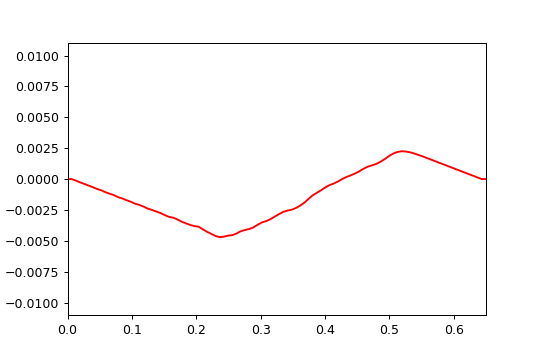

In [7]:
plt.close()
def update(frame):
    ax.clear()
    ax.set_xlim(0, L)
    ax.set_ylim(-1.1*h, 1.1*h)
    draw, = ax.plot(x, f[frame + t0_index], color='r')
    return draw,

fig = plt.figure()
ax = fig.add_subplot()
N_skip = 10
ani3 = FuncAnimation(fig, update, frames=[_ for _ in range(0, int(Nt), N_skip)], interval=5, blit=True)

Resultatet er en bølge som vandrer opp og ned langs gitarstrengen. For å finne lyden trenger vi amplituden til hver løsning som funksjon av tid. For å gjøre dette utnytter vi ortonormaliteten i indreporduktet mellom funksjonen $f(x,t)$ og sinusfunksjonen 
$\sin\left(\frac{m\pi}{L}x\right)$. Man kan vise at 

$$
\frac{2}{L}\int_0^L\sin\left(\frac{n\pi}{L}x\right)\sin\left(\frac{m\pi}{L}x\right)\;dx = \delta_{nm}
$$

som gir oss med f(x,t) i indreproduktet

\begin{align}
\frac{2}{L}\int_0^Lf(x,t)\cdot\sin\left(\frac{m\pi}{L}x\right)\;dx 
&= \frac{2}{L}\int_0^L\sum_{n=0}^\infty A_n(t)\sin(k_nx)\cdot\sin\left(\frac{m\pi}{L}x\right)\;dx \\
&= \frac{2}{L}\sum_{n=0}^\infty A_n(t)\int_0^L\sin\left(\frac{n\pi}{L}x\right)\cdot\sin\left(\frac{m\pi}{L}x\right)\;dx \\
&= \sum_{n=0}^\infty A_n(t)\cdot\delta_{nm} \\
&= A_m(t)
\end{align}

der jeg har definert $A_n(t) = A_n\cos(\omega_nt)$ fra uttrykket i $f(x,t)$. På denne måten kan jeg finne amplituden til bølge $m$ som funksjon av tid gjennom hele signalet. Til slutt summerer jeg opp flere bølge-amplituder for å få det totale signalet til slutt. Det viktigste her er å merke seg at amplituden er proporsjonal med integralet, altså

$$
A_m(t) \propto \int_0^Lf(x,t)\cdot\sin\left(\frac{m\pi}{L}x\right)\;dx
$$

siden lydstyrkeverdiene blir veldig lave dersom vi gjør dette numerisk, dropper jeg $\frac{2}{L}$-leddet og infinitesimalen $dx$ i programmet. Vi summerer sammen de $m=10$ første bølgene (for å ikke overlaste programmet). Dette produserer denne lyden. 

In [8]:
# Finner koeffisientene A_n(t) som er i signalene
def inner_prod(m):
    sin_arr = np.sin(m*np.pi*x/L)
    return np.array([np.sum(sin_arr*s, axis=0) for s in f])       # Egentlig et integral, så må ha med dx. Men da blir lyden lav, og tenker at amplituden er prop. med integralet og ignorerer dx.

M = 10
harmonics = np.array([inner_prod(m) for m in range(1, M+1)])

tot = np.sum(harmonics, axis=0)

wavfile.write('model1.wav', int(1/dt), tot.astype(np.float32))
Audio('model1.wav')

Dette høres ut som en lyd som muligens kan være noe, men minner foreløpig mer om et lasteskip som tuter . En av faktorene som gjør modellen urealistisk er at lyden ikke dempes på noen måte, som bør være enkelt å fikse siden vi gjør dette numerisk. Vi tar modellen vår videre til det neste steget, og undersøker hvordan vi kan gjøre det bedre.

## Vi legger på litt mer 
Den forrige modellen av gitarstrengen var ok, men mangelfull på mange måter. Vi bestemmer oss for å legge til to nye elementer i modellen vår: 

* Vi legger til dempning. Dette leddet går som $\gamma\frac{\partial f}{\partial t}$ der $\gamma\;[\mathrm{m}]$ er dempningsfaktoren. 

* Vi legger også til at strengen strekker seg når vi plukker den. Her gjøres også en ansats på at leddet skal gå som $l^2\frac{\partial^4f}{\partial x^4}$ der $l\;[\mathrm{s/m^2}]$ er den karakteristiske lengden til gitarstrengen. Tanken her er å få med seg hvordan strengen strekker seg i utslagene, siden det er laget av et tøyelig materiale.

Begge leddene er hentet fra http://large.stanford.edu/courses/2007/ph210/pelc2/ for modellering av bølgefunksjonen. 

Prosessen er lik som sist, men denne gangen trenger vi å diskretisere likningen

$$
\frac{\partial^2 f}{\partial x^2} - \frac{1}{v^2}\frac{\partial^2 f}{\partial t^2} - \gamma\frac{\partial f}{\partial t} - l^2\frac{\partial^4 f}{\partial x^4} = 0
$$

Vi diskretiserer den normale delen av bølgelikningen som sist. For den første-ordens deriverte velger jeg å midtpunktderivere, og uttrykket for stress i strengen diskretiseres også, men utledningen viser jeg ikke her (tanken er den samme, gjør annenhver framlengs og baklengs derivasjon for å få hensiktsmessige indekser å jobbe med). Da ender jeg opp med likningen 

$$
\frac{f_{i,j+1}- 2f_{i,j} + f_{i,j-1}}{\Delta x^2} - \frac{1}{v^2}\frac{f_{i+1,j} - 2f_{i,j} + f_{i-1,j}}{\Delta t^2} - \gamma\frac{f_{i+1,j} - f_{i-1,j}}{2\Delta t} - l^2\frac{f_{i,j+2} - 4f_{i,j+1} + 6f_{i,j} - 4f_{i,j-1} + f_{i,j-2}}{\Delta x^4} = 0
$$

vi løser denne for $f_{i+1,j}$, og får da at 

$$
f_{i+1,j} = \left[\frac{1}{v^2\Delta t^2} + \frac{\gamma}{2\Delta t}\right]^{-1}\left(\frac{f_{i,j+1}- 2f_{i,j} + f_{i,j-1}}{\Delta x^2} + \frac{1}{v^2}\frac{2f_{i,j} - f_{i-1,j}}{\Delta t^2} + \gamma\frac{f_{i-1,j}}{2\Delta t} - l^2\frac{f_{i,j+2} - 4f_{i,j+1} + 6f_{i,j} - 4f_{i,j-1} + f_{i,j-2}}{\Delta x^4}\right)
$$

vi implementerer dette på lik måte som forrige gang. Gjennom timesvis av testing med prøv og feil har jeg kommet frem til at $l=1\cdot10^{-4}\;\mathrm{m}$ og $\gamma = 9\cdot10^{-5}\;\mathrm{s/m^2}$ gir gode resultater. 

In [9]:
l = 1e-4       # strekningsfaktor, m 
gamma = 9e-5    # dempningsfaktor, s/m^2 

f = np.zeros((int(Nt), Nx))    # Funksjonen vår f
t0 = 0.5             # s, der vi starter å løse likningen 
t0_index = int(t0 / dt)   # Finner indeksen for t0
f[0:t0_index+1] = y0     # Setter initialbetingelse 

@njit
def solve_waveeq_adv(f_array, times, length, dt, dx, l, gamma):
    for i in range(t0_index, times-1):
        for j in range(2, length-2):
            outer_factor = (1/(v**2 * dt**2) + gamma/(2*dt))**(-1)
            p1 = 1 / dx**2 * (f_array[i, j+1] - 2*f_array[i, j] + f_array[i, j-1])
            p2 = 1 / (v**2 * dt**2) * (2*f_array[i, j] - f_array[i-1, j])
            p3 = gamma / (2*dt) * f_array[i-1, j]
            p4 = -l**2 / dx**4 * (f_array[i, j+2] - 4*f_array[i, j+1] + 6*f_array[i, j] - 4*f_array[i, j-1] + f_array[i, j-2])
            f_array[i+1, j] = outer_factor * (p1 + p2 + p3 + p4)
    return f_array

f = solve_waveeq_adv(f, Nt, Nx, dt, dx, l, gamma)

Vi sjekker løsningen, og ser om det ble noen merkverdig forskjell i modellen:

<IPython.core.display.Javascript object>


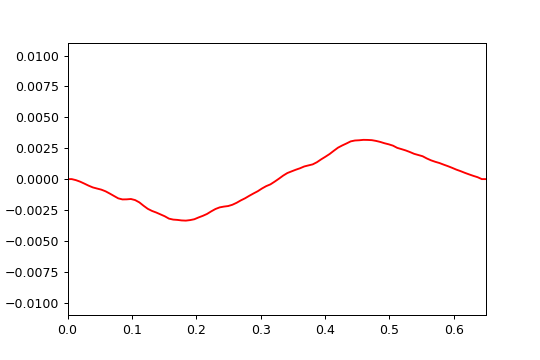

In [10]:
plt.close()
def update(frame):
    ax.clear()
    ax.set_xlim(0, L)
    ax.set_ylim(-1.1*h, 1.1*h)
    draw, = ax.plot(x, f[frame + t0_index], color='r')
    return draw,

fig = plt.figure()
ax = fig.add_subplot()
N_skip = 10
ani4 = FuncAnimation(fig, update, frames=[_ for _ in range(0, int(Nt), N_skip)], interval=5, blit=True)

Vi summerer kun for de $m=10$ første løsningene vi får slik at koden ikke skal ta alt for lang tid å kjøre samtidig som det høres greit ut, og lager en lyd ut av koeffisientene vi finner gjennom indreproduktet mellom to sinus-bølger. Med dette genererer vi lyden

In [11]:
# Finner koeffisientene A_n(t) som er i signalene
def inner_prod(m):
    sin_arr = np.sin(m*np.pi*x/L)
    return np.array([np.sum(sin_arr*s, axis=0) for s in f])

M = 10
harmonics = np.array([inner_prod(m) for m in range(1, M+1)])   # Dropper 0 fordi det ikke gir noe bidrag

tot = np.sum(harmonics, axis=0)
wavfile.write('model2.wav', int(1/dt), tot.astype(np.float32))  
Audio('model2.wav')

Til sammenlikning har jeg spilt inn samme tone fra en ekte gitar, lagt til ved lyden nedenfor:

In [12]:
# Leser inn data fra ekte gitar
fs, guitar_real = wavfile.read('C3_real_guitar.wav')
N = len(guitar_real)
dts = 1 / fs
Audio('C3_real_guitar.wav')

Etter mine ører høres dette relativt godt ut, men det er ikke særlig vitenskapelig å gå på gehør. Derfor gjør jeg kjører jeg noe frekvensanalyse på lydene slik at det blir enklere å sammenlikne. Først gjør jeg en Fourier-transformasjon av begge lydsingalene slik at jeg kan se hvilke frekvenser som inngår i lydene og hvor mye av hver frekvens. Jeg plotter også selve lydsignalene.

Vi bruker en diskret versjon av Fouriertransformasjonen, og bruker numpy.fft for å gjøre dette raskere (og slippe å implementere det). 

<IPython.core.display.Javascript object>


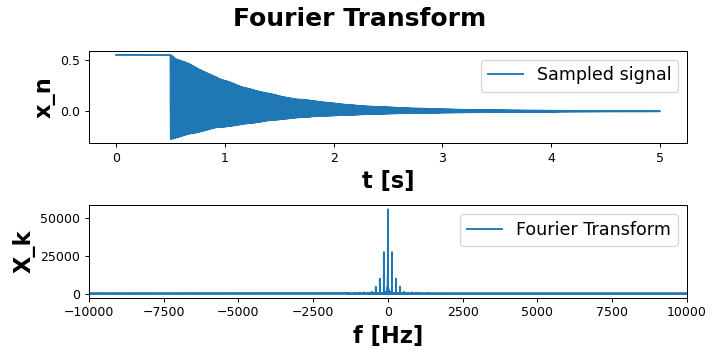

<IPython.core.display.Javascript object>


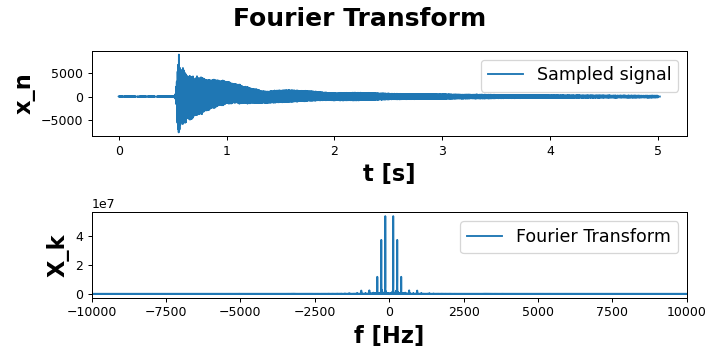

In [13]:
plt.close()
def plot_Fourier(data, N, dt, title='', xlim=10000):
    X_k = np.fft.fft(data)   # FT av samplet frekvens
    FT_freq = np.fft.fftfreq(int(N), dt)     # FT-frekvens (korrekt)
    t = np.linspace(0, N*dt, int(N))
    
    fig = plt.figure(figsize=(8, 4))
    ax1 = fig.add_subplot(211)
    ax2 = fig.add_subplot(212)
    ax1.plot(t, data, label='Sampled signal')
    ax2.plot(FT_freq, abs(X_k), label='Fourier Transform')
    fig.suptitle('Fourier Transform', weight='bold', fontsize=20)
    ax1.set_xlabel('t [s]', weight='bold', fontsize=18)
    ax1.set_ylabel('x_n', weight='bold', fontsize=18)
    ax2.set_xlabel('f [Hz]', weight='bold', fontsize=18)
    ax2.set_ylabel('X_k', weight='bold', fontsize=18)
    ax2.set_xlim(-xlim, xlim)    # Setter grenser på begge plott så det blir enklere å se, siden de har ulike nyquistfrekvenser 

    fig.tight_layout()
    ax1.legend(prop={'size':14}); ax2.legend(prop={'size':14})
    
plot_Fourier(tot, Nt, dt, title='FT of constructed guitar sound')
plot_Fourier(guitar_real, N, dts, title='FT of real life guitar')

Dersom vi ser på de plottede signalene ser vi tydelig at lydene har en veldig lik profil. 

Jeg ønsker også å se hvor i signalene de ulike frekvensene oppstår, slik at jeg kan få en enda bedre forståelse på hva som foregår. For å gjøre dette gjør jeg en Wavelet-transformasjon med en Morlet-Wavelet. En Morlet-Wavelet i diskrete signaler kan skrives som 

$$
\Psi(t_n) = C\left(e^{-i\omega_a(t_n - t_k)} - e^{-K^2}\right)e^{-\frac{\omega_a^2(t_n - t_k)^2}{2K^2}}
$$

og Wavelet-transformasjonen er da definert som konvolusjonen (på diskret form for digitale signaler) mellom signal og wavelet 

$$
\gamma(\omega_a, t_k) = x_n*\Psi(t_n) = \sum_{n=1}^N x_n\Psi^*(t_n)
$$

Vi trenger ikke å tenke på hva de ulike konstantene i disse uttrykkene betyr, fordi herfra bruker vi et lurt triks: vi bruker konvolusjonsteoremet ved Fouriertransformasjoner til å skrive om 

$$
\mathscr{F}\{x_n*\Psi\} = \mathscr{F}\{x_n\}\cdot\mathscr{F}\{\Psi\}
$$

som gir oss at 

$$
x_n*\Psi = \mathscr{F}^{-1}\{\{\mathscr{F}\{x_n\}\cdot \mathscr{F}\{\Psi\}\}\}
$$

hvor Fourier-transformasjonen av Morlet-Waveleten er gitt som

$$
\mathscr{F}\{\Psi\}(\omega) = 2e^{-[K(\omega - \omega_a) / \omega_a]^2} - e^{-K^2}e^{-[K\omega/\omega_a]^2}
$$

der $\omega$ er frekvensspekteret til Waveleten, $\omega_a$ er analysefrekvensen (vinkelfrekvensen med frekvensen vi ønsker å sjekke ligger i signalet vårt), og $K$ er en positiv konstant. På denne måten ganger vi bare sammen Fouriertransformasjonene til lydsignalet og waveleten (med andre ord de frekvensene som ligger oppå hverandre i frekvensdomenet), og henter kun ut de frekvensene i signalet som vi også har i waveleten før vi reverserer det med invers Fourier-transformasjon tilbake til tidsdomenet. Dette går veldig mye fortere enn dersom vi skulle gått gjennom hver eneste frekvens for alle mulige tidspunkter. Vi implementerer denne algoritmen og plotter for lydsignalet vi har generert med bølgelikningen og opptaket av den ekte gitaren. Jeg bruker $K=25$ da jeg syntes denne gir en grei oppløsning for både tid og frekvens. 

I tillegg velger jeg å nedsample signalene mine, slik at vi kan gjøre analysen tidsnok til middag. Siden jeg vet at sample-raten i lyden av den ekte gitaren er $fs = 44100\;\mathrm{Hz}$ (som er mindre enn sample-raten i lyden vi har generert med bølgefunksjonen) og at vi ser på frekvenser opp til $600\mathrm{Hz}$ kan vi regne oss frem til gjennom Nyqvist teorem at vi kan skippe så mye som 

$$
sample_{skip,max} = \frac{44100\;\mathrm{Hz}}{2\cdot600\;\mathrm{Hz}} = 36.75
$$

Jeg setter denne på $sample_{skip}=20$ bare for å være helt safe, og det er nok uansett for at koden kjører på grei tid. 

44100.0 199999.99999999997


<IPython.core.display.Javascript object>


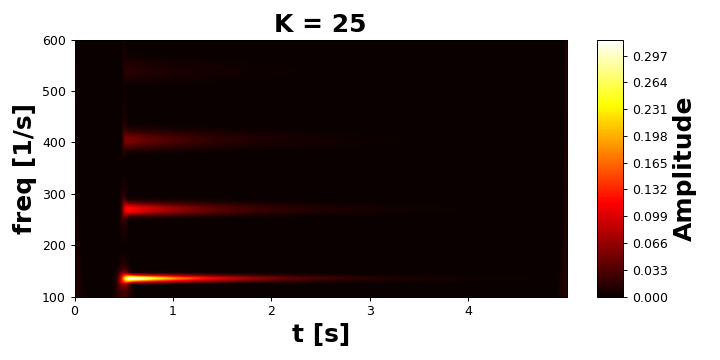

<IPython.core.display.Javascript object>


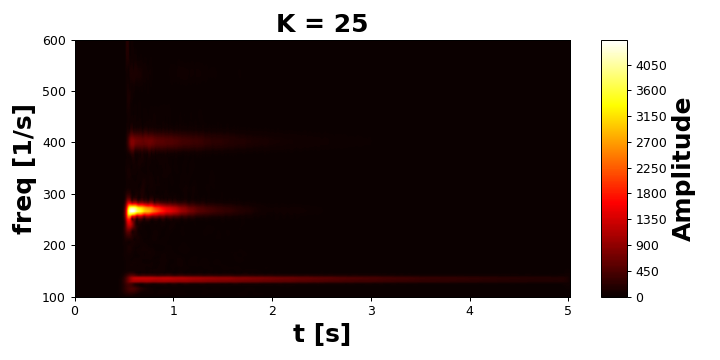

In [14]:
plt.close()
plt.close()
# Fouriertransform av Morlet-wavelet
def FT_wavelet(omega, omega_a, K):
    w = 2 * (np.exp(-(K * (omega - omega_a)/omega_a)**2) - np.exp(-K**2) * np.exp(-(K*omega/omega_a)**2))
    return w

def faster_wavelet_diagram(signal, dt, N, omega_a, K, sample_skip=1, from_time=0):
    tk = np.linspace(0, N*dt, int(N))[::sample_skip]
    N = len(tk)
    fs = 1 / (dt*sample_skip)
    dt = 1 / fs
    omega_a_mesh, tk_mesh = np.meshgrid(omega_a, tk, indexing='ij')
    omega_0 = np.fft.fftfreq(int(N), dt) * 2*np.pi
    x_n = signal.copy()[::sample_skip]
    x_nFT = np.fft.fft(x_n)
    N = len(tk)
    M = len(omega_a)
    WT = np.zeros([M, N], dtype=np.complex128)
    for i in range(M):
            WT[i, :] = np.fft.ifft(x_nFT * FT_wavelet(omega_0, omega_a[i], K)) # Konvolusjonsteoremet
    
    freq_mesh = omega_a_mesh.copy() / (2*np.pi)
    fig = plt.figure(figsize=(8,4))
    ax = fig.add_subplot()
    sec = int(from_time / dt)
    p = ax.contourf(tk_mesh[:, sec:], freq_mesh[:, sec:], abs(WT[:, sec:]), levels=300, cmap='hot')
    cbar_ax = fig.colorbar(p, ax=ax, aspect=10)

    cbar_ax.set_label('Amplitude', weight='bold', fontsize=20)
    ax.set_xlabel('t [s]', weight='bold', fontsize=20); ax.set_ylabel('freq [1/s]', weight='bold', fontsize=20)
    ax.set_title(f'K = {K}', weight='bold', fontsize=20)

    fig.tight_layout()
    plt.show()

K = 25
omega_a = np.linspace(100, 600, 100) * 2*np.pi

sample_skip = 20        # Lov fordi laveste sample-rate av de to signalene er 44100. Vi har frekvenser på ca. 600: 44100 / (2*600) = 36.75
print(1 / dts, 1 / dt)

faster_wavelet_diagram(tot, dt, Nt, omega_a, K, sample_skip, from_time=0)
faster_wavelet_diagram(guitar_real, dts, N, omega_a, K, sample_skip, from_time=0)

Vi legger merke til noen forskjeller ved det første sekundet, og hopper over de første 0.5 sekundene lyden spiller av i tillegg og undersøker. 

<IPython.core.display.Javascript object>


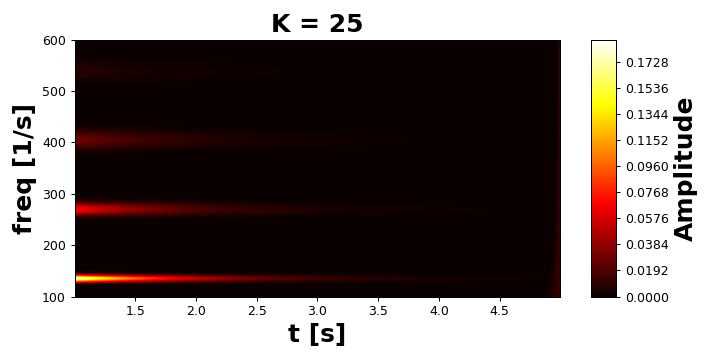

<IPython.core.display.Javascript object>


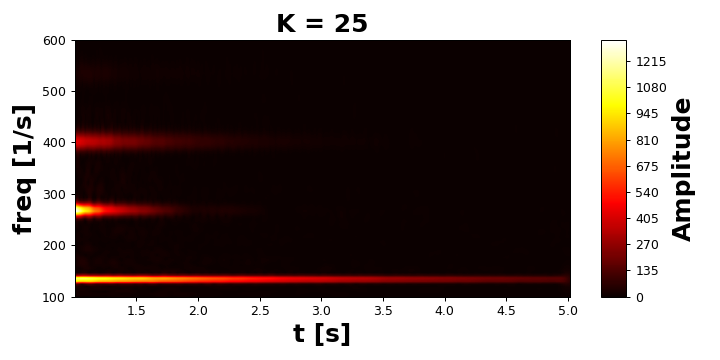

In [15]:
plt.close()
plt.close()

faster_wavelet_diagram(tot, dt, Nt, omega_a, K, sample_skip, from_time=1)
faster_wavelet_diagram(guitar_real, dts, N, omega_a, K, sample_skip, from_time=1)

# Konklusjon 

Fra plottene av Fouriertransformasjonen kan vi se at lydsignalene følger en veldig lik profil. I plottet av frekvensspektrene ser vi også at begge lydene har en ganske lik profil, som topper seg inn mot midten. Her ser det ut som at det syntetiske lydsignalet har litt tettere med frekvenser, spesielt inn mot midten av spekteret der frekvensen er 0. Dette har ikke frekvensspekteret til lyden av den ekte gitaren. 

I Wavelet-transformasjonen gjør vi en dypere analyse av lydsignalet, og der ser vi noe som kan virke interessant. På frekvenser rundt 250 - 290Hz ser det ut som at lyden av den ekte gitaren har en forsterket amplitude sammenliknet med simuleringen. Jeg testet dette for flere opptak av samme tone på gitaren for å se, og mønsteret dukket opp hver gang. 

* Det kan komme av at jeg plukker strengen på starten av signalet, og lyden av gitarstrengen som slipper av fingeren gir en skarp lyd som plukkes opp. 


* Det er en faktisk frekvens som finnes i lydsignalet fra strengen når vi spiller gitaren, og denne er årsaken til hvorfor gitarlydene høres litt forskjellig ut. Likevel syntes jeg det er rart at den slår ut med høyere amplitude grunnfrekvensen på 130.81Hz.

Jeg tror det mulgigens er en kombinasjon av begge to, og det faktum at gitarstengen blir plukket mens den simulerte gitarstrengen bare starter der gir en liten forskjell på lydklippene ved de første 0.5 sekundene. 

Det vi også ser er at dersom vi plotter signalene slik at vi hopper denne biten (ca. 1 sekund på plottene, dvs. 0.5 sekunder etter lyden ble spilt), er de veldig like ellers (det som har blitt gjort i plottene ovenfor). Det vi da kan se er at stripen som ligger på 250-290Hz dempes fortere enn den i vår genererte gitarlyd. Vi ser også at grunnfrekvensen dempes fortere i vår genererte lyd enn den gjør i den ekte gitaren. Dette har antakeligvis med valg av demping å gjøre, men det er også begrenset til en viss del gitt hvordan den er modellert. 

### Hva slags begrensninger har vi? 

En gitar kan lyde på mange forksjellige måter, ut ifra hva slags materialer som er brukt i gitaren (hva slags type tre den er laget av) og strengene (materiale, tykkelse, stivhet). Det er på sett og hvis noen elementer av dette som er forsøkt lagt inn, men som enhver modell er dette begrenset til parameterene man kan justere på. 

For å analysere dataen blir vi også nødt til å nedsample, fordi Wavelet-analysen er omfattende beregningsmessig. Det betyr på sett og hvis at vi mister informasjon i plottet, men ikke så mye at jeg tror dette er kritisk. 

### Så, kan vi simulerere en gitarstreng ved å bruke bølgefunksjonen? 

Alt i alt vil konkludere med at selv om det er noe syntetisk ved lyden som lages, vil dette virke som en veldig god approksimasjon til en ekte gitarstreng. Å bruke bølgefunksjonen funket veldig bra som en enkel modell å følge, spesielt etter noen justeringer der vi la på demping av lyden. Jeg tror strengt tatt at delen av modellen som inneholder strekk av gitarstrengen ikke påvirker løsningen i noen veldig stor grad, og er noe vi kunne sett bort ifra som en approksimasjon til å gjøre problemet enklere siden en gitarstreng ikke strekker seg veldig mye da utslagene er små. Dette er kanskje viktigere i modeller med strenger som skal strekkes lengere. 



In [16]:
Audio('model2.wav')

In [17]:
Audio('C3_real_guitar.wav')

<IPython.core.display.Javascript object>


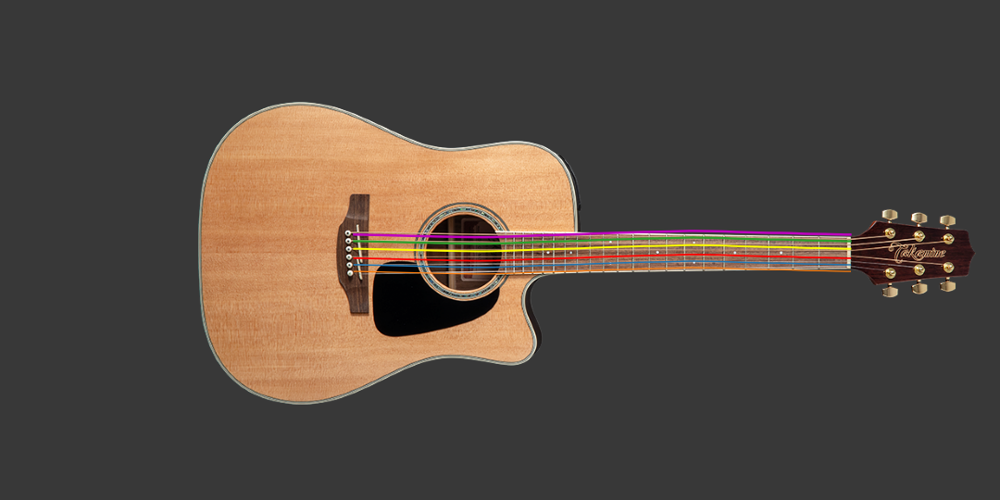

In [18]:
plt.close()
plt.close()
guitar_img = plt.imread('guitar.png')
image_box_guitar = OffsetImage(guitar_img, zoom=0.7)
guitar = AnnotationBbox(image_box_guitar, (L/2 - 0.02, -5e-3), frameon=False, zorder=0)

N_skip = 30
def update_guitar(frame):
    ax.clear()
    ax.set_xlim(-0.3, 1.1*L)
    ax.set_ylim(-0.2, 0.2)
    ax.axis('off')
    draw, = ax.plot(x, f[frame + t0_index]+0.015, color='m', linewidth=2)
    draw2, = ax.plot(x, f[frame + t0_index]+0.008, color='tab:green', linewidth=1.8)
    draw3, = ax.plot(x, f[frame + t0_index], color='yellow', linewidth=1.6)
    draw4, = ax.plot(x, f[frame + t0_index]-0.01, color='red', linewidth=1.4)
    draw5, = ax.plot(x, f[frame + t0_index]-0.017, color='tab:blue', linewidth=1.2)
    draw6, = ax.plot(x, f[frame + t0_index]-0.024, color='tab:orange', linewidth=1)
    ax.add_artist(guitar)
    return draw, draw2, draw3, draw4, draw5, draw6

fig = plt.figure(facecolor=[0.22, 0.22, 0.22], figsize=(12, 6))
ax = fig.add_subplot()
ani_guitar = FuncAnimation(fig, update_guitar, frames=[_ for _ in range(0, int(Nt), N_skip)], interval=5, blit=True)

Takk for meg, og takk til deg som leser! 